# Converting depth images to point clouds using open3d

This notebook is the visual equivalent of the script `scripts/example.py`.
Check the readme for more details.


In [1]:
from pathlib import Path

import cv2
import numpy as np
import matplotlib.pyplot as plt
import open3d as o3d
import ipywidgets as widgets
from IPython.display import display

from pointcloud_tools import PointCloudCreator, create_pcd_from_array, read_pcd, write_pcd

Jupyter environment detected. Enabling Open3D WebVisualizer.
[Open3D INFO] WebRTC GUI backend enabled.
[Open3D INFO] WebRTCWindowSystem: HTTP handshake server disabled.


In [2]:
# point to the data dir
current_folder = Path(".").resolve()
base_dir = current_folder.parent / "data"

## Demo images

A single example of a tomato depth image is included.


In [3]:
# point to the image files
image = "B_0328ab97"

# Construct the file paths for reading RGB/Depth images
rgb_file = base_dir / "rgb" / f"{image}.png"
depth_file = base_dir / "depth" / f"{image}_depth.png"

# Construct the file paths for saving segemented RGB and filtered Depth images
segmented_file = base_dir / "rgb" / f"{image}_segmented.png"
filtered_depth_file = base_dir / "depth" / f"{image}_filtered.png"

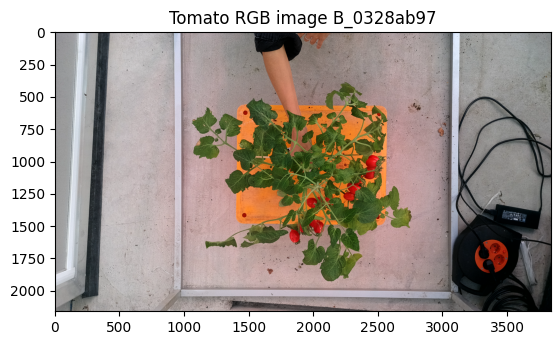

In [4]:
rgb_img = cv2.cvtColor(cv2.imread(str(rgb_file)), cv2.COLOR_BGR2RGB)
plt.imshow(rgb_img)
plt.title(f"Tomato RGB image {image}")
plt.show()

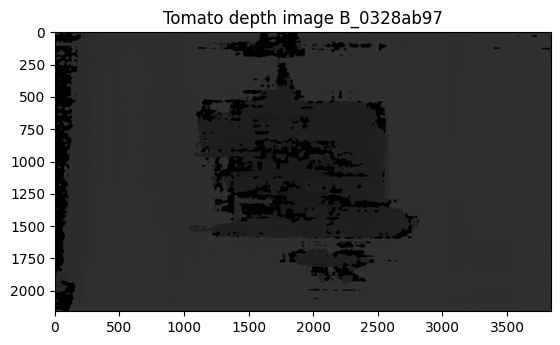

In [5]:
# The depth image is provided by the camera, and is a reconstruction from stero infra-red imaging.
depth_img = cv2.imread(str(depth_file), cv2.IMREAD_UNCHANGED)
plt.imshow(depth_img, cmap="gray")
plt.title(f"Tomato depth image {image}")
plt.show()

In [6]:
# Convert BGR to HSV
hsv_img = cv2.cvtColor(cv2.imread(str(rgb_file)), cv2.COLOR_RGB2HSV)


# Define range for green color and then mask it
green_lower = np.array([50, 30, 30])
green_upper = np.array([86, 255, 255])
green_mask = cv2.inRange(hsv_img, green_lower, green_upper)

# Define range for red color and then mask it
# Note: Red color wraps around 0 in HSV, requiring two ranges
red_lower1 = np.array([0, 50, 50])
red_upper1 = np.array([10, 255, 255])
red_lower2 = np.array([170, 50, 50])
red_upper2 = np.array([180, 255, 255])
red_mask1 = cv2.inRange(hsv_img, red_lower1, red_upper1)
red_mask2 = cv2.inRange(hsv_img, red_lower2, red_upper2)
red_mask = cv2.bitwise_or(red_mask1, red_mask2)

# Combine the masks
combined_mask = cv2.bitwise_or(green_mask, red_mask)

# Apply the mask to get the segmented image
segmented_image = cv2.bitwise_and(rgb_img, rgb_img, mask=combined_mask)

# Save the images
cv2.imwrite(str(segmented_file), segmented_image)

# Convert the segmented image to RGB
segmented_rgb_img = cv2.cvtColor(cv2.imread(str(segmented_file)), cv2.COLOR_HSV2RGB)


# Resize the mask to match the depth image dimensions
combined_mask_resized = cv2.resize(combined_mask, (depth_img.shape[1], depth_img.shape[0]))
# Use bitwise_and to apply the mask to the depth image, filtering out unwanted parts
filtered_depth_image = cv2.bitwise_and(depth_img, depth_img, mask=combined_mask_resized)

# Save the images
cv2.imwrite(str(filtered_depth_file), filtered_depth_image)

# Read the filtered depth image
filtered_depth_img = cv2.imread(str(filtered_depth_file), cv2.IMREAD_UNCHANGED)

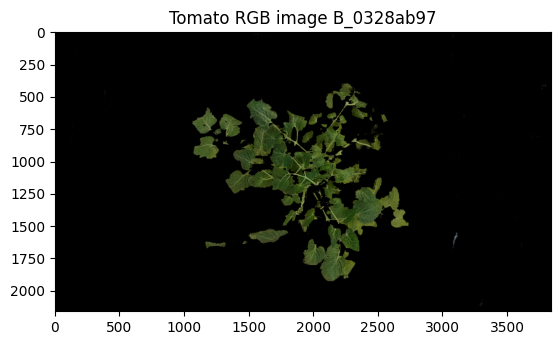

In [7]:
plt.imshow(segmented_image)
plt.title(f"Tomato RGB image {image}")
plt.show()

# Now we create a point cloud object


In [8]:
# init a point cloud creator with the camera configuration
point_cloud_creator = PointCloudCreator(conf_file=base_dir / "oak-d-s2-poe_conf.json", logger_level=100)

# create pcd object
pcd_object = point_cloud_creator.convert_depth_to_pcd(rgb_file=rgb_file, depth_file=depth_file)

In [9]:
# init a point cloud creator with the camera configuration
point_cloud_creator = PointCloudCreator(conf_file=base_dir / "oak-d-s2-poe_conf.json", logger_level=100)

# create pcd object
masked_pcd_object = point_cloud_creator.convert_depth_to_pcd(rgb_file=segmented_file, depth_file=filtered_depth_file)

In [10]:
# Estimate normals
pcd_object.estimate_normals(search_param=o3d.geometry.KDTreeSearchParamHybrid(radius=0.1, max_nn=300))

# Apply Poisson surface reconstruction
with o3d.utility.VerbosityContextManager(o3d.utility.VerbosityLevel.Debug) as cm:
    mesh, densities = o3d.geometry.TriangleMesh.create_from_point_cloud_poisson(pcd_object, depth=9)

[Open3D DEBUG] Input Points / Samples: 7576335 / 14153
[Open3D DEBUG] #   Got kernel density: 0.005616903305053711 (s), 1349.4609375 (MB) / 1349.4609375 (MB) / 2019 (MB)
[Open3D DEBUG] #     Got normal field: 0.05616188049316406 (s), 1355.8359375 (MB) / 1355.8359375 (MB) / 2019 (MB)
[Open3D DEBUG] Point weight / Estimated Area: 8.025919e-09 / 6.080705e-02
[Open3D DEBUG] #       Finalized tree: 0.038500070571899414 (s), 1355.01953125 (MB) / 1355.8359375 (MB) / 2019 (MB)
[Open3D DEBUG] #  Set FEM constraints: 0.03660297393798828 (s), 1355.01953125 (MB) / 1355.8359375 (MB) / 2019 (MB)
[Open3D DEBUG] #Set point constraints: 0.005784034729003906 (s), 1355.01953125 (MB) / 1355.8359375 (MB) / 2019 (MB)
[Open3D DEBUG] Leaf Nodes / Active Nodes / Ghost Nodes: 160504 / 183416 / 17
[Open3D DEBUG] Memory Usage: 1355.020 MB
Cycle[0] Depth[0/9]:	Updated constraints / Got system / Solved in:  0.000 /  0.000 /  0.000	(1355.020 MB)	Nodes: 8
CG: 5.0777e-02 -> 5.0777e-02 -> 3.5071e-08 (6.9e-07) [32764]
[

In [11]:
# Estimate normals
masked_pcd_object.estimate_normals(search_param=o3d.geometry.KDTreeSearchParamHybrid(radius=0.01, max_nn=3))

# Apply Poisson surface reconstruction
with o3d.utility.VerbosityContextManager(o3d.utility.VerbosityLevel.Debug) as cm:
    masked_mesh, masked_densities = o3d.geometry.TriangleMesh.create_from_point_cloud_poisson(
        masked_pcd_object, depth=8
    )

[Open3D DEBUG] Input Points / Samples: 613506 / 5731
[Open3D DEBUG] #   Got kernel density: 0.004199981689453125 (s), 1365.4609375 (MB) / 1365.4609375 (MB) / 2019 (MB)
[Open3D DEBUG] #     Got normal field: 0.03236794471740723 (s), 1365.4609375 (MB) / 1365.4609375 (MB) / 2019 (MB)
[Open3D DEBUG] Point weight / Estimated Area: 3.405946e-07 / 2.089568e-01
[Open3D DEBUG] #       Finalized tree: 0.03930997848510742 (s), 1365.4609375 (MB) / 1365.4609375 (MB) / 2019 (MB)
[Open3D DEBUG] #  Set FEM constraints: 0.056756019592285156 (s), 1365.4609375 (MB) / 1365.4609375 (MB) / 2019 (MB)
[Open3D DEBUG] #Set point constraints: 0.009613990783691406 (s), 1365.4609375 (MB) / 1365.4609375 (MB) / 2019 (MB)
[Open3D DEBUG] Leaf Nodes / Active Nodes / Ghost Nodes: 148401 / 168792 / 809
[Open3D DEBUG] Memory Usage: 1365.461 MB
Cycle[0] Depth[0/8]:	Updated constraints / Got system / Solved in:  0.000 /  0.000 /  0.000	(1365.461 MB)	Nodes: 8
CG: 1.2359e-01 -> 1.2359e-01 -> 5.2782e-08 (4.3e-07) [32764]
[Open

In [12]:
# Visualize the point cloud
o3d.visualization.draw_geometries([pcd_object])

[Open3D WARNING] GLFW Error: X11: The DISPLAY environment variable is missing
[Open3D WARNING] Failed to initialize GLFW
[Open3D WARNING] [DrawGeometries] Failed creating OpenGL window.


In [13]:
# Visualize the point cloud
o3d.visualization.draw_geometries([masked_pcd_object])

[Open3D WARNING] GLFW Error: X11: The DISPLAY environment variable is missing
[Open3D WARNING] Failed to initialize GLFW
[Open3D WARNING] [DrawGeometries] Failed creating OpenGL window.


In [14]:
# Visualize the mesh
o3d.visualization.draw_plotly([mesh])

In [15]:
# Visualize the mesh
o3d.visualization.draw_plotly([masked_mesh])

## Quick visualization to validate the output.

More advanced visualization tools from open3d are available:

https://www.open3d.org/docs/latest/tutorial/Basic/jupyter.html

Or use one of the many point cloud viewers.


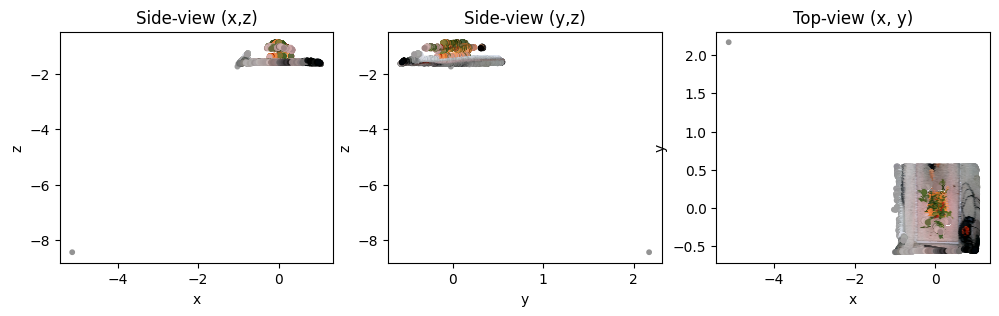

In [16]:
# Extract points and colors
points = np.asarray(pcd_object.points)
colors = np.asarray(pcd_object.colors)

# downsample to make the plotting faster

# use -y because the pixel coordinates differs from the matrix coordinate system
# use -z because the camera is facing downwards
x = points[range(0, len(points), 100), 0]
y = -points[range(0, len(points), 100), 1]
z = -points[range(0, len(points), 100), 2]
c = colors[range(0, len(points), 100), :]

fig, axs = plt.subplots(ncols=3, figsize=(12, 3))

axs[0].scatter(x, z, c=c, s=10)
axs[0].set_xlabel("x")
axs[0].set_ylabel("z")
axs[0].set_title("Side-view (x,z)")

axs[1].scatter(y, z, c=c, s=10)
axs[1].set_xlabel("y")
axs[1].set_ylabel("z")
axs[1].set_title("Side-view (y,z)")

axs[2].scatter(x, y, c=c, s=10)
axs[2].set_xlabel("x")
axs[2].set_ylabel("y")
axs[2].set_title("Top-view (x, y)")

plt.show()